In [112]:
import random
import copy
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter

seed = 449
random.seed(seed)
torch.manual_seed(seed)
writer = SummaryWriter(flush_secs=20)

# %tensorboard --logdir runs

In [113]:
batch_size = 128
image_size = 32
nc = 3      # number of channels in training image
nz = 128    # latent vector size

# size of feature maps in generator and discriminator
ngf = 64
ndf = 64

num_epochs = 64
lr = 0.0002
beta1 = 0.5
ngpu = 1
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(device)

cuda:0


In [114]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=False, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=False, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)
classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# functions to show an image
def imshow(img, animated=False):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimg, (1, 2, 0)), animated=animated)
    plt.show()

dataiter = iter(trainloader)
# images, labels = next(dataiter)

# imshow(torchvision.utils.make_grid(images))
# writer.add_image("training_images", torchvision.utils.make_grid(images))
# print(' '.join(f'{classes[labels[j]]:5s}' for j in range(batch_size)))

In [115]:
# custom weights init from DCGAN paper
# TODO: try other initializations too
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [116]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.net = nn.Sequential(
            # nc x 32 x 32 input
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf x 16 x 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf*2 x 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf*4 x 4 x 4
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    def forward(self, input):
        return self.net(input)

In [117]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.net = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ngf*4) x 4 x 4``
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ngf*2) x 8 x 8``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ngf) x 16 x 16``
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 32 x 32``
        )

    def forward(self, x):
        return self.net(x)


In [118]:
netD = Discriminator(ngpu).to(device)
netD.apply(weights_init)

# images, labels = next(dataiter)
# images = images.to(device)
# output = netD(images)
# print(output[0])

Discriminator(
  (net): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)

In [119]:
netG = Generator(ngpu).to(device)
netG.apply(weights_init)

# noise = torch.randn(batch_size, nz, 1, 1, device=device)
# print(noise.shape)
# fakes = netG(noise)
# fakes = fakes.cpu()
# print(fakes.shape)

# imshow(torchvision.utils.make_grid(fakes))

Generator(
  (net): Sequential(
    (0): ConvTranspose2d(128, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)

In [120]:
img_list = []
G_losses = []
D_losses = []
saved_gens = [copy.deepcopy(netG)]
gen_min = 0

lossG_min = 999

iters = 0

real = 1.
fake = 0.

loss_fn = nn.BCELoss()
fixed_noise = torch.randn(32, nz, 1, 1, device=device)
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

for epoch in tqdm(range(num_epochs)):
    for i, data in enumerate(trainloader):
        ################################
        # Update Discriminator
        netD.zero_grad()
        images = data[0].to(device)
        b_size = images.shape[0]
        labels = torch.full((b_size,), real, dtype=torch.float, device=device)

        # Discriminator with real images
        output = netD(images).view(-1)
        lossD_real = loss_fn(output, labels)
        lossD_real.backward()
        D_x = output.mean().item()

        # Generate fake images
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fakes = netG(noise)
        labels.fill_(fake)
        
        # Classify fakes with Discriminator
        output = netD(fakes.detach()).view(-1)
        lossD_fake = loss_fn(output, labels)
        lossD_fake.backward()
        D_G_z1 = output.mean().item()

        lossD = lossD_real + lossD_fake
        optimizerD.step()
        ################################
        # Update Generator
        netG.zero_grad()
        labels.fill_(real)

        # Classify fakes with updated Discriminator
        output = netD(fakes).view(-1)
        lossG = loss_fn(output, labels)
        lossG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if (epoch > num_epochs / 2 and lossG.item() < lossG_min):
            gen_min = copy.deepcopy(netG)
            lossG_min = lossG.item()

        # Training Stats
        if iters % 500 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(trainloader),
                     lossD.item(), lossG.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(lossG.item())
            D_losses.append(lossD.item())
            writer.add_scalar("loss/gen", lossG, iters)
            writer.add_scalar("loss/discrim", lossD, iters)

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(trainloader)-1)):
            with torch.no_grad():
                generated = netG(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(generated))
            writer.add_image("generated_images", torchvision.utils.make_grid(generated) / 2 + 0.5, iters)
            saved_gens.append(copy.deepcopy(netG))
            print(iters)
        iters += 1

writer.flush()
writer.close()
torch.save(saved_gens[-1].state_dict(), "models/DCGAN/64ep_DLReLU-GReLU.pt")

  0%|          | 0/64 [00:00<?, ?it/s]

[0/64][0/391]	Loss_D: 1.5260	Loss_G: 2.4721	D(x): 0.4161	D(G(z)): 0.4023 / 0.1030
0


  2%|▏         | 1/64 [00:11<11:45, 11.19s/it]

[1/64][109/391]	Loss_D: 0.1864	Loss_G: 8.0583	D(x): 0.8585	D(G(z)): 0.0050 / 0.0007
500


  3%|▎         | 2/64 [00:22<11:31, 11.15s/it]

[2/64][218/391]	Loss_D: 0.4072	Loss_G: 2.9293	D(x): 0.8364	D(G(z)): 0.1609 / 0.0815
1000


  5%|▍         | 3/64 [00:33<11:20, 11.16s/it]

[3/64][327/391]	Loss_D: 0.3029	Loss_G: 4.1746	D(x): 0.9385	D(G(z)): 0.1902 / 0.0244
1500


  8%|▊         | 5/64 [00:55<10:55, 11.10s/it]

[5/64][45/391]	Loss_D: 0.3717	Loss_G: 2.7521	D(x): 0.7821	D(G(z)): 0.0922 / 0.0924
2000


  9%|▉         | 6/64 [01:06<10:42, 11.08s/it]

[6/64][154/391]	Loss_D: 0.4554	Loss_G: 2.4530	D(x): 0.7827	D(G(z)): 0.1557 / 0.1143
2500


 11%|█         | 7/64 [01:17<10:30, 11.06s/it]

[7/64][263/391]	Loss_D: 0.9419	Loss_G: 1.4879	D(x): 0.4786	D(G(z)): 0.0766 / 0.2741
3000


 12%|█▎        | 8/64 [01:28<10:19, 11.06s/it]

[8/64][372/391]	Loss_D: 0.5859	Loss_G: 2.0145	D(x): 0.7627	D(G(z)): 0.2277 / 0.1752
3500


 16%|█▌        | 10/64 [01:50<09:57, 11.07s/it]

[10/64][90/391]	Loss_D: 2.0815	Loss_G: 5.1883	D(x): 0.8198	D(G(z)): 0.7936 / 0.0098
4000


 17%|█▋        | 11/64 [02:01<09:46, 11.06s/it]

[11/64][199/391]	Loss_D: 0.5018	Loss_G: 2.0885	D(x): 0.7983	D(G(z)): 0.2159 / 0.1513
4500


 19%|█▉        | 12/64 [02:13<09:37, 11.11s/it]

[12/64][308/391]	Loss_D: 0.4215	Loss_G: 2.9265	D(x): 0.8784	D(G(z)): 0.2292 / 0.0761
5000


 22%|██▏       | 14/64 [02:35<09:13, 11.08s/it]

[14/64][26/391]	Loss_D: 0.8635	Loss_G: 2.4187	D(x): 0.7722	D(G(z)): 0.4028 / 0.1210
5500


 23%|██▎       | 15/64 [02:46<09:04, 11.11s/it]

[15/64][135/391]	Loss_D: 0.8299	Loss_G: 2.9982	D(x): 0.8771	D(G(z)): 0.4678 / 0.0631
6000


 25%|██▌       | 16/64 [02:57<08:58, 11.23s/it]

[16/64][244/391]	Loss_D: 0.8247	Loss_G: 2.3123	D(x): 0.7730	D(G(z)): 0.3888 / 0.1237
6500


 27%|██▋       | 17/64 [03:09<08:47, 11.23s/it]

[17/64][353/391]	Loss_D: 0.4850	Loss_G: 2.0177	D(x): 0.8001	D(G(z)): 0.2103 / 0.1643
7000


 30%|██▉       | 19/64 [03:31<08:18, 11.07s/it]

[19/64][71/391]	Loss_D: 0.7178	Loss_G: 2.0750	D(x): 0.7080	D(G(z)): 0.2714 / 0.1573
7500


 31%|███▏      | 20/64 [03:41<08:02, 10.97s/it]

[20/64][180/391]	Loss_D: 0.5972	Loss_G: 1.8483	D(x): 0.7593	D(G(z)): 0.2399 / 0.1933
8000


 33%|███▎      | 21/64 [03:52<07:49, 10.91s/it]

[21/64][289/391]	Loss_D: 0.7873	Loss_G: 2.1712	D(x): 0.7944	D(G(z)): 0.3921 / 0.1402
8500


 36%|███▌      | 23/64 [04:14<07:26, 10.89s/it]

[23/64][7/391]	Loss_D: 0.6273	Loss_G: 1.3300	D(x): 0.6736	D(G(z)): 0.1735 / 0.2993
9000


 38%|███▊      | 24/64 [04:25<07:13, 10.84s/it]

[24/64][116/391]	Loss_D: 0.8606	Loss_G: 2.1882	D(x): 0.7445	D(G(z)): 0.3702 / 0.1405
9500


 39%|███▉      | 25/64 [04:35<07:02, 10.84s/it]

[25/64][225/391]	Loss_D: 0.5895	Loss_G: 1.9476	D(x): 0.7667	D(G(z)): 0.2489 / 0.1720
10000


 41%|████      | 26/64 [04:47<06:55, 10.93s/it]

[26/64][334/391]	Loss_D: 1.2269	Loss_G: 1.2061	D(x): 0.6506	D(G(z)): 0.4566 / 0.3530
10500


 44%|████▍     | 28/64 [05:08<06:33, 10.93s/it]

[28/64][52/391]	Loss_D: 0.7754	Loss_G: 1.6348	D(x): 0.7544	D(G(z)): 0.3441 / 0.2259
11000


 45%|████▌     | 29/64 [05:19<06:22, 10.93s/it]

[29/64][161/391]	Loss_D: 0.4882	Loss_G: 2.5061	D(x): 0.8412	D(G(z)): 0.2459 / 0.1043
11500


 47%|████▋     | 30/64 [05:30<06:10, 10.90s/it]

[30/64][270/391]	Loss_D: 0.9517	Loss_G: 1.0285	D(x): 0.5224	D(G(z)): 0.1614 / 0.4243
12000


 48%|████▊     | 31/64 [05:41<06:00, 10.94s/it]

[31/64][379/391]	Loss_D: 0.6439	Loss_G: 1.7797	D(x): 0.7226	D(G(z)): 0.2312 / 0.2130
12500


 52%|█████▏    | 33/64 [06:03<05:37, 10.89s/it]

[33/64][97/391]	Loss_D: 0.8479	Loss_G: 0.8037	D(x): 0.5012	D(G(z)): 0.0805 / 0.4965
13000


 53%|█████▎    | 34/64 [06:14<05:28, 10.95s/it]

[34/64][206/391]	Loss_D: 0.6773	Loss_G: 1.3480	D(x): 0.6225	D(G(z)): 0.1232 / 0.3232
13500


 55%|█████▍    | 35/64 [06:25<05:20, 11.04s/it]

[35/64][315/391]	Loss_D: 0.9071	Loss_G: 1.2902	D(x): 0.6684	D(G(z)): 0.3147 / 0.3351
14000


 58%|█████▊    | 37/64 [06:47<04:58, 11.07s/it]

[37/64][33/391]	Loss_D: 0.3709	Loss_G: 2.9086	D(x): 0.9392	D(G(z)): 0.2461 / 0.0712
14500


 59%|█████▉    | 38/64 [06:59<04:49, 11.12s/it]

[38/64][142/391]	Loss_D: 0.6023	Loss_G: 2.4678	D(x): 0.8097	D(G(z)): 0.2746 / 0.1195
15000


 61%|██████    | 39/64 [07:10<04:38, 11.16s/it]

[39/64][251/391]	Loss_D: 1.4781	Loss_G: 2.6451	D(x): 0.8439	D(G(z)): 0.6252 / 0.1194
15500


 62%|██████▎   | 40/64 [07:21<04:27, 11.16s/it]

[40/64][360/391]	Loss_D: 1.2024	Loss_G: 4.7303	D(x): 0.9288	D(G(z)): 0.6176 / 0.0130
16000


 66%|██████▌   | 42/64 [07:43<04:05, 11.16s/it]

[42/64][78/391]	Loss_D: 0.5658	Loss_G: 2.7645	D(x): 0.7504	D(G(z)): 0.2036 / 0.0953
16500


 67%|██████▋   | 43/64 [07:54<03:53, 11.14s/it]

[43/64][187/391]	Loss_D: 0.5665	Loss_G: 2.9334	D(x): 0.8811	D(G(z)): 0.3210 / 0.0736
17000


 69%|██████▉   | 44/64 [08:05<03:41, 11.10s/it]

[44/64][296/391]	Loss_D: 0.4741	Loss_G: 2.3858	D(x): 0.8171	D(G(z)): 0.2059 / 0.1197
17500


 72%|███████▏  | 46/64 [08:28<03:22, 11.27s/it]

[46/64][14/391]	Loss_D: 0.4945	Loss_G: 1.7481	D(x): 0.7200	D(G(z)): 0.1143 / 0.2355
18000


 73%|███████▎  | 47/64 [08:40<03:11, 11.26s/it]

[47/64][123/391]	Loss_D: 0.4032	Loss_G: 2.4905	D(x): 0.8527	D(G(z)): 0.1890 / 0.1112
18500


 75%|███████▌  | 48/64 [08:51<02:58, 11.18s/it]

[48/64][232/391]	Loss_D: 1.2638	Loss_G: 1.4012	D(x): 0.5131	D(G(z)): 0.2915 / 0.3231
19000


 77%|███████▋  | 49/64 [09:01<02:46, 11.11s/it]

[49/64][341/391]	Loss_D: 0.4041	Loss_G: 2.8922	D(x): 0.8418	D(G(z)): 0.1788 / 0.0763
19500


 80%|███████▉  | 51/64 [09:24<02:24, 11.08s/it]

[51/64][59/391]	Loss_D: 0.6514	Loss_G: 3.9119	D(x): 0.9221	D(G(z)): 0.3912 / 0.0301
20000


 81%|████████▏ | 52/64 [09:35<02:13, 11.10s/it]

[52/64][168/391]	Loss_D: 0.4220	Loss_G: 3.0384	D(x): 0.8778	D(G(z)): 0.2299 / 0.0671
20500


 83%|████████▎ | 53/64 [09:46<02:02, 11.15s/it]

[53/64][277/391]	Loss_D: 0.6047	Loss_G: 1.4162	D(x): 0.6583	D(G(z)): 0.0958 / 0.3204
21000


 84%|████████▍ | 54/64 [09:57<01:52, 11.24s/it]

[54/64][386/391]	Loss_D: 0.4799	Loss_G: 2.5950	D(x): 0.8204	D(G(z)): 0.2071 / 0.1092
21500


 88%|████████▊ | 56/64 [10:20<01:30, 11.27s/it]

[56/64][104/391]	Loss_D: 0.3395	Loss_G: 2.3889	D(x): 0.8550	D(G(z)): 0.1472 / 0.1303
22000


 89%|████████▉ | 57/64 [10:31<01:18, 11.17s/it]

[57/64][213/391]	Loss_D: 0.3993	Loss_G: 3.1486	D(x): 0.8694	D(G(z)): 0.2048 / 0.0631
22500


 91%|█████████ | 58/64 [10:43<01:08, 11.38s/it]

[58/64][322/391]	Loss_D: 0.4149	Loss_G: 2.5367	D(x): 0.8067	D(G(z)): 0.1502 / 0.1086
23000


 94%|█████████▍| 60/64 [11:06<00:45, 11.32s/it]

[60/64][40/391]	Loss_D: 0.3559	Loss_G: 2.2414	D(x): 0.8257	D(G(z)): 0.1292 / 0.1388
23500


 95%|█████████▌| 61/64 [11:17<00:33, 11.25s/it]

[61/64][149/391]	Loss_D: 0.3725	Loss_G: 2.0878	D(x): 0.8076	D(G(z)): 0.1228 / 0.1807
24000


 97%|█████████▋| 62/64 [11:28<00:22, 11.25s/it]

[62/64][258/391]	Loss_D: 0.2610	Loss_G: 2.8448	D(x): 0.8455	D(G(z)): 0.0775 / 0.0869
24500


 98%|█████████▊| 63/64 [11:40<00:11, 11.38s/it]

[63/64][367/391]	Loss_D: 1.7630	Loss_G: 5.6760	D(x): 0.9644	D(G(z)): 0.7056 / 0.0085
25000
25023


100%|██████████| 64/64 [11:52<00:00, 11.13s/it]


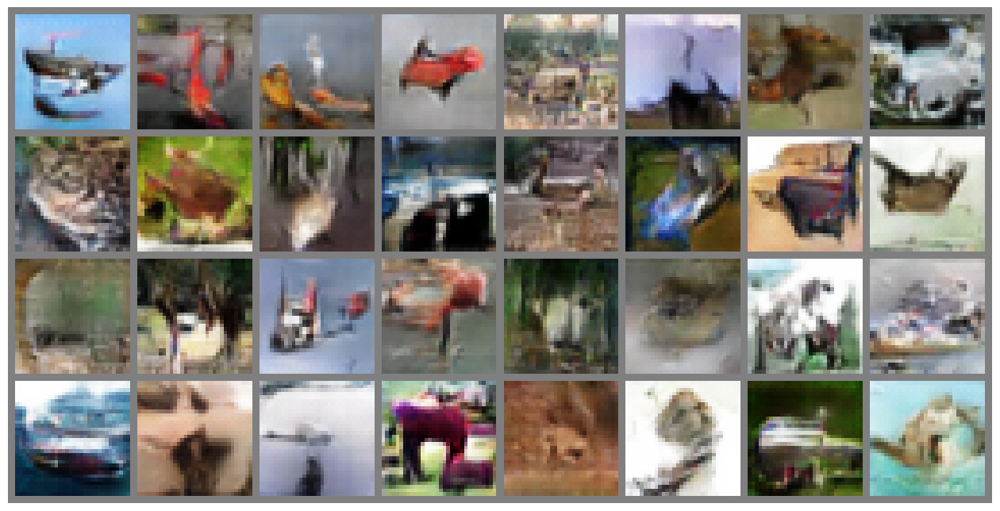

In [121]:
# for img in img_list:
#     imshow(img)

fig = plt.figure(figsize=(16,16))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i/2 + 0.5,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

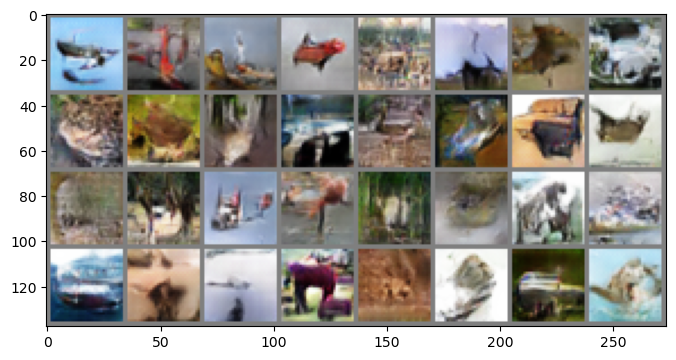

In [123]:
# print(torch.load("models/DCGAN/64ep_DLReLU-GReLU.pt"))
loaded = Generator(ngpu).to(device)
loaded.load_state_dict(torch.load("models/DCGAN/64ep_DLReLU-GReLU.pt"))

loaded.net.eval()
out = loaded(fixed_noise).cpu()


imshow(torchvision.utils.make_grid(out))